In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import keras
import tensorflow as tf
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras import regularizers
from tensorflow.keras.models import Sequential
import imageio
import os

In [69]:
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()


In [3]:
selected_labels = [6]  # Labels for T-shirt/top, Pullover, Coat, Shirt

# Concatenate images for selected labels
selected_train_images = np.concatenate([train_images[train_labels == label] for label in selected_labels])
selected_train_labels = np.concatenate([train_labels[train_labels == label] for label in selected_labels])
selected_test_images = np.concatenate([test_images[test_labels == label] for label in selected_labels])
selected_test_labels = np.concatenate([test_labels[test_labels == label] for label in selected_labels])



In [4]:
# Define preprocessing function
def preprocess_images(images):
    images = (images.astype('float32') - 127.5) / 127.5
    return np.expand_dims(images, axis=-1)

# Preprocess the selected images
preprocessed_train_images = preprocess_images(selected_train_images)
preprocessed_test_images = preprocess_images(selected_test_images)

In [5]:
img_size = (28,28,1)

In [6]:
preprocessed_train_images.shape

(6000, 28, 28, 1)

In [7]:
#preprocessed_train_images = preprocessed_train_images[:-16]

In [8]:
#selected_train_labels = selected_train_labels[:-16]

In [9]:
img_datagen = ImageDataGenerator(preprocessing_function=None) 

# Flow from preprocessed NumPy arrays
TrainSample = img_datagen.flow(
    x=preprocessed_train_images,
    y=selected_train_labels,
    batch_size=32,
    shuffle=True
)

In [10]:
#print("Shape:", TrainSample.image_shape)

for i in range(3):
    batch = next(TrainSample)
    print("Dimension", i+1, ":", batch[0].shape)

Dimension 1 : (32, 28, 28, 1)
Dimension 2 : (32, 28, 28, 1)
Dimension 3 : (32, 28, 28, 1)


In [ ]:
import matplotlib.pyplot as plt

# Assuming X_train is already preprocessed in batches of 32
# If X_train is a batch of images, you should access the first batch
# You can visualize the first image in the first batch like this:
plt.imshow(selected_images_test[56], cmap='Greys')
plt.show()


In [11]:
latent_dim = 100

In [181]:
#generator
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(7 * 7 * 256, input_dim=latent_dim),
    tf.keras.layers.Reshape((7, 7, 256)),
    
    tf.keras.layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Conv2DTranspose(1, (3, 3), strides=(1, 1), padding='same', activation='tanh')
])


In [182]:
generator.summary()

Model: "sequential_63"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_26 (Dense)            (None, 12544)             1266944   
                                                                 
 reshape_11 (Reshape)        (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose_36 (Conv2  (None, 14, 14, 128)       524416    
 DTranspose)                                                     
                                                                 
 batch_normalization_28 (Ba  (None, 14, 14, 128)       512       
 tchNormalization)                                               
                                                                 
 leaky_re_lu_56 (LeakyReLU)  (None, 14, 14, 128)       0         
                                                                 
 dropout_56 (Dropout)        (None, 14, 14, 128)     

In [183]:
#disciminator
discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(8, (3, 3), strides=(2, 2), padding='same', input_shape=img_size),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.3),
    
    tf.keras.layers.Conv2D(16, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.3),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

In [184]:
discriminator.summary()

Model: "sequential_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_31 (Conv2D)          (None, 14, 14, 8)         80        
                                                                 
 leaky_re_lu_58 (LeakyReLU)  (None, 14, 14, 8)         0         
                                                                 
 dropout_58 (Dropout)        (None, 14, 14, 8)         0         
                                                                 
 conv2d_32 (Conv2D)          (None, 7, 7, 16)          1168      
                                                                 
 leaky_re_lu_59 (LeakyReLU)  (None, 7, 7, 16)          0         
                                                                 
 dropout_59 (Dropout)        (None, 7, 7, 16)          0         
                                                                 
 flatten_15 (Flatten)        (None, 784)             

In [185]:
#optimization
optimizer_disc = tf.keras.optimizers.legacy.Adam(learning_rate=0.0002)
optimizer_gen = tf.keras.optimizers.legacy.Adam(learning_rate=0.0002)

# Compile the discriminator
discriminator.compile(loss='binary_crossentropy', optimizer=optimizer_disc, metrics=['accuracy'])

# Update the GAN architecture
gan_input = tf.keras.layers.Input(shape=(latent_dim,))
generated_image = generator(gan_input)
discriminator_output = discriminator(generated_image)

gan = tf.keras.Model(gan_input, discriminator_output)
gan.compile(loss='binary_crossentropy', optimizer=optimizer_gen)



In [186]:
import numpy as np
import matplotlib.pyplot as plt

def plot_generated_images(epoch, generator, examples=10, dim=(1, 10), figsize=(10, 5), save_dir='generated_images'):
    noise = np.random.normal(0, 1, (examples, latent_dim))  # Adjust the size of noise if needed
    generated_images = generator.predict(noise)
    generated_images = (generated_images + 1) / 2  # Rescale images from [-1, 1] to [0, 1] if needed

    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    plt.figure(figsize=figsize)
    for i in range(examples):
        plt.subplot(dim[0], dim[1], i + 1)
        if generated_images.shape[-1] == 1:  # If grayscale image
            plt.imshow(generated_images[i, :, :, 0], cmap='gray')
        else:  # If RGB image
            plt.imshow(generated_images[i])
        plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, f'gan_generated_image_epoch_{epoch}.png'))
    plt.show()
    plt.close()

In [187]:
def create_gif(image_folder, gif_name):
    images = []
    for file_name in sorted(os.listdir(image_folder), key=lambda x: int(x.split('_')[-1].split('.')[0])):
        if file_name.endswith('.png'):
            file_path = os.path.join(image_folder, file_name)
            images.append(imageio.imread(file_path))
    imageio.mimsave(gif_name, images, duration=0.5) 

In [188]:
def train_gan(gan, discriminator, generator, TrainSample, batch_size, epochs, sample_interval):
    for epoch in range(epochs):
        # Generate noise
        noise = np.random.normal(0, 1, (batch_size, latent_dim))
        # Generate fake images using the generator
        fake_imgs = generator.predict(noise)
        # Resize fake images to 64x64 pixels
        #fake_imgs_resized = resize_images(fake_imgs, (64, 64))
        
        # Get a batch of real images and labels from the data generator
        real_imgs_batch = next(TrainSample)
        #real_imgs_resized = resize_images(real_imgs_batch, (64, 64))
        
        # Ensure that the batch sizes match
        #batch_size = min(real_imgs_resized.shape[0], fake_imgs_resized.shape[0])
        
        # Train the discriminator on real and fake images)
        train_label = np.ones(shape = (batch_size, 1))
        discriminator.trainable = True
        d_loss_real = discriminator.train_on_batch(real_imgs_batch[0], train_label)
        
        
        d_loss_fake = discriminator.train_on_batch(fake_imgs[:batch_size], np.zeros((batch_size, 1)))
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        
        # Train the generator
        noise = np.random.normal(0, 1, (batch_size, latent_dim))
        discriminator.trainable = False
        g_loss = gan.train_on_batch(noise, train_label)
        print(f"Epoch {epoch}, Discriminator Loss: {d_loss}, Generator Loss: {g_loss}")

        # Debugging and monitoring
        if epoch % sample_interval == 0:
            # Plot generated images
            plot_generated_images(epoch, generator)


1/1 [==============================] - 0s 52ms/step
Epoch 0, Discriminator Loss: 0.6847037971019745, Generator Loss: 0.6302127838134766
1/1 [==============================] - 0s 41ms/step


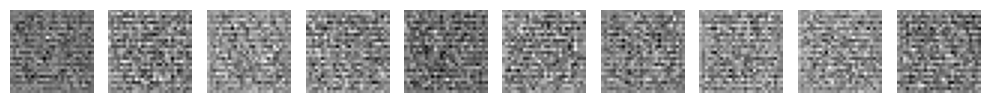

1/1 [==============================] - 0s 19ms/step
Epoch 1, Discriminator Loss: 0.6873099207878113, Generator Loss: 0.5659332275390625
1/1 [==============================] - 0s 17ms/step
Epoch 2, Discriminator Loss: 0.6723216772079468, Generator Loss: 0.5287752151489258
1/1 [==============================] - 0s 19ms/step
Epoch 3, Discriminator Loss: 0.6515337228775024, Generator Loss: 0.5223531126976013
1/1 [==============================] - 0s 21ms/step
Epoch 4, Discriminator Loss: 0.6529195308685303, Generator Loss: 0.4713340997695923
1/1 [==============================] - 0s 25ms/step
Epoch 5, Discriminator Loss: 0.6405438482761383, Generator Loss: 0.42530032992362976
1/1 [==============================] - 0s 22ms/step
Epoch 6, Discriminator Loss: 0.622859925031662, Generator Loss: 0.4019622802734375
1/1 [==============================] - 0s 21ms/step
Epoch 7, Discriminator Loss: 0.6360155045986176, Generator Loss: 0.3536006212234497
1/1 [==============================] - 0s 21ms/s

1/1 [==============================] - 0s 18ms/step
Epoch 61, Discriminator Loss: 0.6048221364617348, Generator Loss: 0.03998267278075218
1/1 [==============================] - 0s 18ms/step
Epoch 62, Discriminator Loss: 0.6008494198322296, Generator Loss: 0.04577727988362312
1/1 [==============================] - 0s 17ms/step
Epoch 63, Discriminator Loss: 0.6145551837980747, Generator Loss: 0.04534395784139633
1/1 [==============================] - 0s 18ms/step
Epoch 64, Discriminator Loss: 0.5993427522480488, Generator Loss: 0.043295394629240036
1/1 [==============================] - 0s 16ms/step
Epoch 65, Discriminator Loss: 0.6217893101274967, Generator Loss: 0.03993654251098633
1/1 [==============================] - 0s 18ms/step
Epoch 66, Discriminator Loss: 0.6058382242918015, Generator Loss: 0.0419221892952919
1/1 [==============================] - 0s 17ms/step
Epoch 67, Discriminator Loss: 0.6153797134757042, Generator Loss: 0.03880877047777176
1/1 [=============================

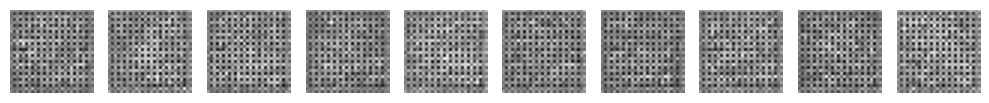

1/1 [==============================] - 0s 18ms/step
Epoch 101, Discriminator Loss: 0.5843687653541565, Generator Loss: 0.008198930881917477
1/1 [==============================] - 0s 23ms/step
Epoch 102, Discriminator Loss: 0.5839280933141708, Generator Loss: 0.0063539668917655945
1/1 [==============================] - 0s 50ms/step
Epoch 103, Discriminator Loss: 0.5522044859826565, Generator Loss: 0.00655751209706068
1/1 [==============================] - 0s 22ms/step
Epoch 104, Discriminator Loss: 0.5851454138755798, Generator Loss: 0.004978368990123272
1/1 [==============================] - 0s 21ms/step
Epoch 105, Discriminator Loss: 0.5627442896366119, Generator Loss: 0.005460979416966438
1/1 [==============================] - 0s 23ms/step
Epoch 106, Discriminator Loss: 0.5720904096961021, Generator Loss: 0.00527413422241807
1/1 [==============================] - 0s 19ms/step
Epoch 107, Discriminator Loss: 0.5462481379508972, Generator Loss: 0.003986746072769165
1/1 [================

1/1 [==============================] - 0s 19ms/step
Epoch 159, Discriminator Loss: 0.31330184638500214, Generator Loss: 0.0001258760312339291
1/1 [==============================] - 0s 19ms/step
Epoch 160, Discriminator Loss: 0.37280412018299103, Generator Loss: 7.7828299254179e-05
1/1 [==============================] - 0s 17ms/step
Epoch 161, Discriminator Loss: 0.3691207766532898, Generator Loss: 9.310362656833604e-05
1/1 [==============================] - 0s 17ms/step
Epoch 162, Discriminator Loss: 0.2812534272670746, Generator Loss: 0.00010565691627562046
1/1 [==============================] - 0s 18ms/step
Epoch 163, Discriminator Loss: 0.31582802534103394, Generator Loss: 8.932534547057003e-05
1/1 [==============================] - 0s 19ms/step
Epoch 164, Discriminator Loss: 0.2735912725329399, Generator Loss: 9.33868286665529e-05
1/1 [==============================] - 0s 16ms/step
Epoch 165, Discriminator Loss: 0.32822881639003754, Generator Loss: 7.678786641918123e-05
1/1 [======

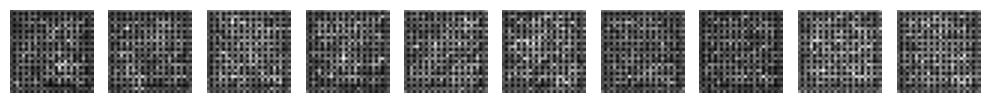

1/1 [==============================] - 0s 21ms/step
Epoch 201, Discriminator Loss: 0.1778288632631302, Generator Loss: 1.829237589845434e-05
1/1 [==============================] - 0s 19ms/step
Epoch 202, Discriminator Loss: 0.24100330471992493, Generator Loss: 1.1758733307942748e-05
1/1 [==============================] - 0s 53ms/step
Epoch 203, Discriminator Loss: 0.2409985512495041, Generator Loss: 1.3071928151475731e-05
1/1 [==============================] - 0s 21ms/step
Epoch 204, Discriminator Loss: 0.3031972050666809, Generator Loss: 2.112545189447701e-05
1/1 [==============================] - 0s 21ms/step
Epoch 205, Discriminator Loss: 0.20454464852809906, Generator Loss: 1.9517297914717346e-05
1/1 [==============================] - 0s 20ms/step
Epoch 206, Discriminator Loss: 0.24301446974277496, Generator Loss: 1.3549195500672795e-05
1/1 [==============================] - 0s 17ms/step
Epoch 207, Discriminator Loss: 0.30520815402269363, Generator Loss: 1.5812476704013534e-05
1/1 

1/1 [==============================] - 0s 21ms/step
Epoch 259, Discriminator Loss: 0.2853935807943344, Generator Loss: 5.458064151753206e-06
1/1 [==============================] - 0s 22ms/step
Epoch 260, Discriminator Loss: 0.3388992249965668, Generator Loss: 6.811095772718545e-06
1/1 [==============================] - 0s 20ms/step
Epoch 261, Discriminator Loss: 0.19148287177085876, Generator Loss: 5.623896868200973e-06
1/1 [==============================] - 0s 21ms/step
Epoch 262, Discriminator Loss: 0.2554372698068619, Generator Loss: 4.005527443950996e-06
1/1 [==============================] - 0s 19ms/step
Epoch 263, Discriminator Loss: 0.18662618845701218, Generator Loss: 7.307977284654044e-06
1/1 [==============================] - 0s 19ms/step
Epoch 264, Discriminator Loss: 0.2964821085333824, Generator Loss: 7.0593719101452734e-06
1/1 [==============================] - 0s 22ms/step
Epoch 265, Discriminator Loss: 0.23345890641212463, Generator Loss: 4.318818355386611e-06
1/1 [====

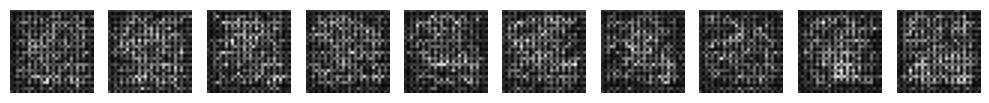

1/1 [==============================] - 0s 23ms/step
Epoch 301, Discriminator Loss: 0.24283915758132935, Generator Loss: 5.277503532852279e-06
1/1 [==============================] - 0s 24ms/step
Epoch 302, Discriminator Loss: 0.24803416430950165, Generator Loss: 5.721679826820036e-06
1/1 [==============================] - 0s 24ms/step
Epoch 303, Discriminator Loss: 0.24986490607261658, Generator Loss: 3.3787732718337793e-06
1/1 [==============================] - 0s 20ms/step
Epoch 304, Discriminator Loss: 0.2546808794140816, Generator Loss: 7.740602086414583e-06
1/1 [==============================] - 0s 19ms/step
Epoch 305, Discriminator Loss: 0.3093218058347702, Generator Loss: 7.328860192501452e-06
1/1 [==============================] - 0s 20ms/step
Epoch 306, Discriminator Loss: 0.32724156975746155, Generator Loss: 3.1777731237525586e-06
1/1 [==============================] - 0s 32ms/step
Epoch 307, Discriminator Loss: 0.33635129034519196, Generator Loss: 4.799238922714721e-06
1/1 [=

1/1 [==============================] - 0s 24ms/step
Epoch 359, Discriminator Loss: 0.4177303910255432, Generator Loss: 0.00034912797855213284
1/1 [==============================] - 0s 18ms/step
Epoch 360, Discriminator Loss: 0.35521742701530457, Generator Loss: 0.000474064756417647
1/1 [==============================] - 0s 33ms/step
Epoch 361, Discriminator Loss: 0.497413694858551, Generator Loss: 0.0005341451033018529
1/1 [==============================] - 0s 21ms/step
Epoch 362, Discriminator Loss: 0.48094308376312256, Generator Loss: 0.0007124170660972595
1/1 [==============================] - 0s 19ms/step
Epoch 363, Discriminator Loss: 0.5403084307909012, Generator Loss: 0.0009096646681427956
1/1 [==============================] - 0s 25ms/step
Epoch 364, Discriminator Loss: 0.46552401781082153, Generator Loss: 0.0009471248486079276
1/1 [==============================] - 0s 19ms/step
Epoch 365, Discriminator Loss: 0.3749252110719681, Generator Loss: 0.0013778770808130503
1/1 [======

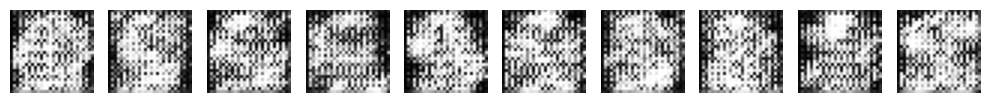

1/1 [==============================] - 0s 25ms/step
Epoch 401, Discriminator Loss: 1.7640631943941116, Generator Loss: 0.03797297179698944
1/1 [==============================] - 0s 22ms/step
Epoch 402, Discriminator Loss: 1.7544731944799423, Generator Loss: 0.03748176246881485
1/1 [==============================] - 0s 20ms/step
Epoch 403, Discriminator Loss: 1.761322021484375, Generator Loss: 0.04500811919569969
1/1 [==============================] - 0s 20ms/step
Epoch 404, Discriminator Loss: 1.7840655073523521, Generator Loss: 0.03802963346242905
1/1 [==============================] - 0s 23ms/step
Epoch 405, Discriminator Loss: 1.6100256741046906, Generator Loss: 0.05119887739419937
1/1 [==============================] - 0s 21ms/step
Epoch 406, Discriminator Loss: 1.7523480504751205, Generator Loss: 0.046500857919454575
1/1 [==============================] - 0s 19ms/step
Epoch 407, Discriminator Loss: 1.72445198148489, Generator Loss: 0.04417036473751068
1/1 [========================

1/1 [==============================] - 0s 19ms/step
Epoch 460, Discriminator Loss: 1.7056954950094223, Generator Loss: 0.06018759310245514
1/1 [==============================] - 0s 20ms/step
Epoch 461, Discriminator Loss: 1.6174836158752441, Generator Loss: 0.0708976686000824
1/1 [==============================] - 0s 21ms/step
Epoch 462, Discriminator Loss: 1.6224603652954102, Generator Loss: 0.05860189348459244
1/1 [==============================] - 0s 21ms/step
Epoch 463, Discriminator Loss: 1.6727593764662743, Generator Loss: 0.055329594761133194
1/1 [==============================] - 0s 19ms/step
Epoch 464, Discriminator Loss: 1.6180610805749893, Generator Loss: 0.05815728008747101
1/1 [==============================] - 0s 20ms/step
Epoch 465, Discriminator Loss: 1.6277868896722794, Generator Loss: 0.07430696487426758
1/1 [==============================] - 0s 20ms/step
Epoch 466, Discriminator Loss: 1.6006823554635048, Generator Loss: 0.05611033737659454
1/1 [======================

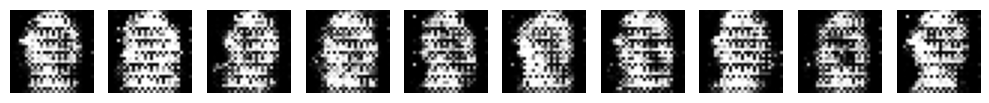

1/1 [==============================] - 0s 22ms/step
Epoch 501, Discriminator Loss: 1.5405930057168007, Generator Loss: 0.07471678406000137
1/1 [==============================] - 0s 20ms/step
Epoch 502, Discriminator Loss: 1.557383768260479, Generator Loss: 0.07233444601297379
1/1 [==============================] - 0s 20ms/step
Epoch 503, Discriminator Loss: 1.5037003308534622, Generator Loss: 0.07306903600692749
1/1 [==============================] - 0s 18ms/step
Epoch 504, Discriminator Loss: 1.513513408601284, Generator Loss: 0.06548535078763962
1/1 [==============================] - 0s 18ms/step
Epoch 505, Discriminator Loss: 1.526831939816475, Generator Loss: 0.07927141338586807
1/1 [==============================] - 0s 19ms/step
Epoch 506, Discriminator Loss: 1.535233050584793, Generator Loss: 0.06579850614070892
1/1 [==============================] - 0s 18ms/step
Epoch 507, Discriminator Loss: 1.5211671739816666, Generator Loss: 0.060142695903778076
1/1 [=========================

1/1 [==============================] - 0s 17ms/step
Epoch 560, Discriminator Loss: 1.5153323709964752, Generator Loss: 0.07764676213264465
1/1 [==============================] - 0s 19ms/step
Epoch 561, Discriminator Loss: 1.4481620639562607, Generator Loss: 0.06563995778560638
1/1 [==============================] - 0s 17ms/step
Epoch 562, Discriminator Loss: 1.477374255657196, Generator Loss: 0.07494725286960602
1/1 [==============================] - 0s 18ms/step
Epoch 563, Discriminator Loss: 1.4769664853811264, Generator Loss: 0.07634393870830536
1/1 [==============================] - 0s 18ms/step
Epoch 564, Discriminator Loss: 1.454794242978096, Generator Loss: 0.07938586175441742
1/1 [==============================] - 0s 18ms/step
Epoch 565, Discriminator Loss: 1.4773296266794205, Generator Loss: 0.07285896688699722
1/1 [==============================] - 0s 19ms/step
Epoch 566, Discriminator Loss: 1.5148716494441032, Generator Loss: 0.07771323621273041
1/1 [========================

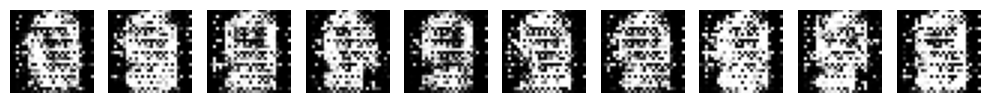

1/1 [==============================] - 0s 22ms/step
Epoch 601, Discriminator Loss: 1.525994896888733, Generator Loss: 0.07696764171123505
1/1 [==============================] - 0s 21ms/step
Epoch 602, Discriminator Loss: 1.5443104058504105, Generator Loss: 0.07080449163913727
1/1 [==============================] - 0s 20ms/step
Epoch 603, Discriminator Loss: 1.540362149477005, Generator Loss: 0.08647669851779938
1/1 [==============================] - 0s 17ms/step
Epoch 604, Discriminator Loss: 1.475742220878601, Generator Loss: 0.08953624963760376
1/1 [==============================] - 0s 16ms/step
Epoch 605, Discriminator Loss: 1.5054329335689545, Generator Loss: 0.08691918849945068
1/1 [==============================] - 0s 18ms/step
Epoch 606, Discriminator Loss: 1.495822697877884, Generator Loss: 0.07000268995761871
1/1 [==============================] - 0s 17ms/step
Epoch 607, Discriminator Loss: 1.5007338374853134, Generator Loss: 0.07726117968559265
1/1 [==========================

1/1 [==============================] - 0s 18ms/step
Epoch 660, Discriminator Loss: 1.4569944143295288, Generator Loss: 0.09174803644418716
1/1 [==============================] - 0s 19ms/step
Epoch 661, Discriminator Loss: 1.4831175208091736, Generator Loss: 0.08508370816707611
1/1 [==============================] - 0s 18ms/step
Epoch 662, Discriminator Loss: 1.3401401787996292, Generator Loss: 0.09770500659942627
1/1 [==============================] - 0s 18ms/step
Epoch 663, Discriminator Loss: 1.389427401125431, Generator Loss: 0.08747592568397522
1/1 [==============================] - 0s 17ms/step
Epoch 664, Discriminator Loss: 1.4244564399123192, Generator Loss: 0.08431051671504974
1/1 [==============================] - 0s 17ms/step
Epoch 665, Discriminator Loss: 1.4180385172367096, Generator Loss: 0.10188828408718109
1/1 [==============================] - 0s 19ms/step
Epoch 666, Discriminator Loss: 1.4337378591299057, Generator Loss: 0.07896804809570312
1/1 [=======================

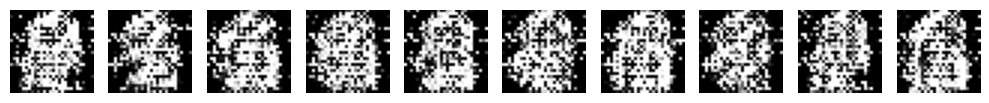

1/1 [==============================] - 0s 22ms/step
Epoch 701, Discriminator Loss: 1.4274832457304, Generator Loss: 0.08236797153949738
1/1 [==============================] - 0s 24ms/step
Epoch 702, Discriminator Loss: 1.4814314097166061, Generator Loss: 0.08167429268360138
1/1 [==============================] - 0s 20ms/step
Epoch 703, Discriminator Loss: 1.4277752414345741, Generator Loss: 0.08526040613651276
1/1 [==============================] - 0s 21ms/step
Epoch 704, Discriminator Loss: 1.4135331138968468, Generator Loss: 0.09183599054813385
1/1 [==============================] - 0s 21ms/step
Epoch 705, Discriminator Loss: 1.3585896492004395, Generator Loss: 0.08268585056066513
1/1 [==============================] - 0s 21ms/step
Epoch 706, Discriminator Loss: 1.3976798951625824, Generator Loss: 0.08484805375337601
1/1 [==============================] - 0s 20ms/step
Epoch 707, Discriminator Loss: 1.4235887825489044, Generator Loss: 0.09004619717597961
1/1 [=========================

1/1 [==============================] - 0s 17ms/step
Epoch 760, Discriminator Loss: 1.3874262422323227, Generator Loss: 0.08607693016529083
1/1 [==============================] - 0s 17ms/step
Epoch 761, Discriminator Loss: 1.3633854910731316, Generator Loss: 0.08670258522033691
1/1 [==============================] - 0s 18ms/step
Epoch 762, Discriminator Loss: 1.4044652208685875, Generator Loss: 0.09795325994491577
1/1 [==============================] - 0s 19ms/step
Epoch 763, Discriminator Loss: 1.3983729928731918, Generator Loss: 0.09289640188217163
1/1 [==============================] - 0s 18ms/step
Epoch 764, Discriminator Loss: 1.3590434789657593, Generator Loss: 0.0928044319152832
1/1 [==============================] - 0s 18ms/step
Epoch 765, Discriminator Loss: 1.4392962455749512, Generator Loss: 0.09607866406440735
1/1 [==============================] - 0s 19ms/step
Epoch 766, Discriminator Loss: 1.3676518946886063, Generator Loss: 0.08551103621721268
1/1 [=======================

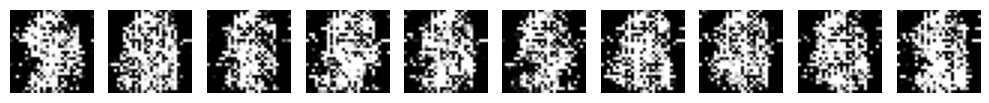

1/1 [==============================] - 0s 20ms/step
Epoch 801, Discriminator Loss: 1.3716498762369156, Generator Loss: 0.09239500015974045
1/1 [==============================] - 0s 18ms/step
Epoch 802, Discriminator Loss: 1.3829604089260101, Generator Loss: 0.09652039408683777
1/1 [==============================] - 0s 19ms/step
Epoch 803, Discriminator Loss: 1.3696829974651337, Generator Loss: 0.10734659433364868
1/1 [==============================] - 0s 18ms/step
Epoch 804, Discriminator Loss: 1.3633922040462494, Generator Loss: 0.09891051799058914
1/1 [==============================] - 0s 20ms/step
Epoch 805, Discriminator Loss: 1.352495513856411, Generator Loss: 0.09686459600925446
1/1 [==============================] - 0s 18ms/step
Epoch 806, Discriminator Loss: 1.3767188787460327, Generator Loss: 0.10506202280521393
1/1 [==============================] - 0s 17ms/step
Epoch 807, Discriminator Loss: 1.3316351175308228, Generator Loss: 0.09491284191608429
1/1 [=======================

1/1 [==============================] - 0s 17ms/step
Epoch 860, Discriminator Loss: 1.3544742614030838, Generator Loss: 0.10430954396724701
1/1 [==============================] - 0s 19ms/step
Epoch 861, Discriminator Loss: 1.3463768139481544, Generator Loss: 0.09836092591285706
1/1 [==============================] - 0s 17ms/step
Epoch 862, Discriminator Loss: 1.348902203142643, Generator Loss: 0.10932546854019165
1/1 [==============================] - 0s 20ms/step
Epoch 863, Discriminator Loss: 1.3122072517871857, Generator Loss: 0.10175153613090515
1/1 [==============================] - 0s 17ms/step
Epoch 864, Discriminator Loss: 1.308777630329132, Generator Loss: 0.10027334094047546
1/1 [==============================] - 0s 18ms/step
Epoch 865, Discriminator Loss: 1.3045412227511406, Generator Loss: 0.10539892315864563
1/1 [==============================] - 0s 20ms/step
Epoch 866, Discriminator Loss: 1.332054279744625, Generator Loss: 0.10254022479057312
1/1 [=========================

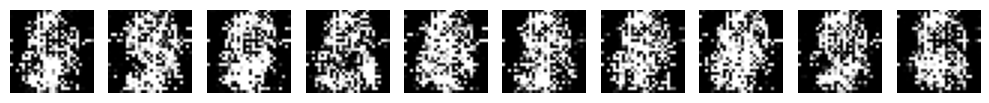

1/1 [==============================] - 0s 24ms/step
Epoch 901, Discriminator Loss: 1.2871405333280563, Generator Loss: 0.10197017341852188
1/1 [==============================] - 0s 27ms/step
Epoch 902, Discriminator Loss: 1.3001845702528954, Generator Loss: 0.10421918332576752
1/1 [==============================] - 0s 22ms/step
Epoch 903, Discriminator Loss: 1.361760452389717, Generator Loss: 0.11087095737457275
1/1 [==============================] - 0s 23ms/step
Epoch 904, Discriminator Loss: 1.3340703547000885, Generator Loss: 0.09314875304698944
1/1 [==============================] - 0s 21ms/step
Epoch 905, Discriminator Loss: 1.3466239422559738, Generator Loss: 0.10759957134723663
1/1 [==============================] - 0s 17ms/step
Epoch 906, Discriminator Loss: 1.3239250853657722, Generator Loss: 0.10944941639900208
1/1 [==============================] - 0s 17ms/step
Epoch 907, Discriminator Loss: 1.306442305445671, Generator Loss: 0.11123381555080414
1/1 [========================

1/1 [==============================] - 0s 17ms/step
Epoch 960, Discriminator Loss: 1.3297663629055023, Generator Loss: 0.10538868606090546
1/1 [==============================] - 0s 18ms/step
Epoch 961, Discriminator Loss: 1.3142478093504906, Generator Loss: 0.10473056137561798
1/1 [==============================] - 0s 16ms/step
Epoch 962, Discriminator Loss: 1.3059354200959206, Generator Loss: 0.10836406797170639
1/1 [==============================] - 0s 17ms/step
Epoch 963, Discriminator Loss: 1.3191611841320992, Generator Loss: 0.0973956435918808
1/1 [==============================] - 0s 17ms/step
Epoch 964, Discriminator Loss: 1.3444642946124077, Generator Loss: 0.10413337498903275
1/1 [==============================] - 0s 18ms/step
Epoch 965, Discriminator Loss: 1.28555166721344, Generator Loss: 0.10331504046916962
1/1 [==============================] - 0s 17ms/step
Epoch 966, Discriminator Loss: 1.3323381170630455, Generator Loss: 0.10895505547523499
1/1 [=========================

In [189]:
#learning_rate = 0.0002
batch_size = 32
epochs = 1000
sample_interval = 100


gan = Sequential()
gan.add(generator)
gan.add(discriminator)
#optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002)
optimizer_disc = tf.keras.optimizers.legacy.Adam(learning_rate=0.0002, beta_1=0.5)
optimizer_gen = tf.keras.optimizers.legacy.Adam(learning_rate=0.0002, beta_1=0.5, clipvalue= 0.01)
discriminator.compile(loss='binary_crossentropy', optimizer=optimizer_disc)
gan.compile(loss='binary_crossentropy', optimizer=optimizer_gen)

# Train the GAN
train_gan(gan, discriminator, generator, TrainSample, batch_size, epochs, sample_interval)


In [178]:
create_gif('generated_images', 'gan_generated_images.gif')

/var/folders/f7/5_rs0ln121z7hspqcqtqhk2c0000gn/T/ipykernel_32571/1815618972.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


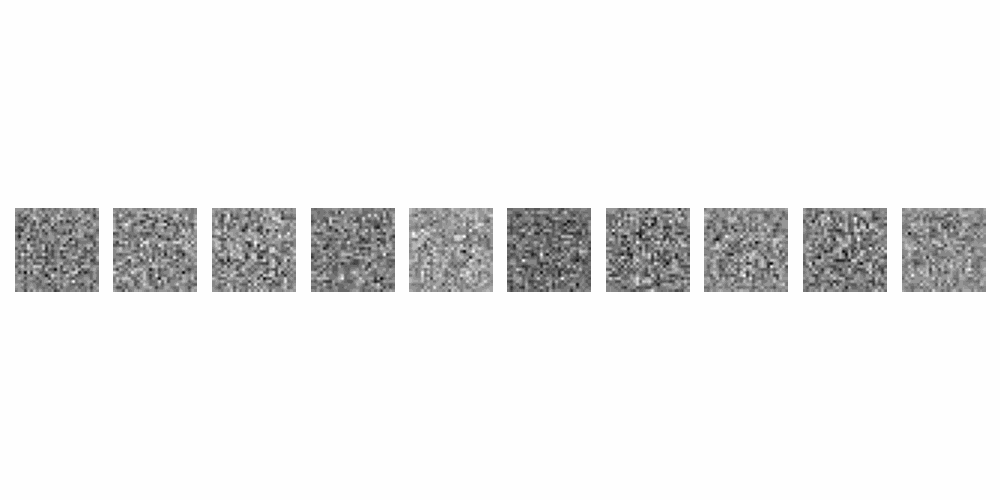

In [179]:
import IPython.display as display
display.Image(filename='gan_generated_images.gif')